**Segmentação de instâncias - Mask-RCNN**

Segmentação de instância, objetos de mesma categoria são tratados como entidades diferentes.

A mask rcnn é uma extensão da FASTER RCNN.

Fluxo:

Imagem -> Extração do bouding box -> saída, classes e coordenadas do bouding box

A rede é de dois estágios:
- Escaneamento das imagens e gera as áreas provaveis que possuam objetos;
- Classificação das áreas e geração das caixas delimitadoras de máscaras.

RCNN: transferência de aprendizagem -> FAST RCNN: rede treinada do zero -> FASTER RCNN

Roi pooling - reduz a dimensionalidade, deixando os objetos do mesmo tamanho.

**Mask RCNN - Backbone**

Rede neural utilizada para extrair as caracteristicas. Primeiramente as caracteristicas de baixo nível.

Imagem -> conv -> conv -> conv -> mapa de características no formato 32x32x2048

**Feature Pyramid Network - FPN**

Técnica para representar melhor os objetos em múltiplas escalas. Uma pirâmede é usada para refinar as características.

**Region Proposal Network - RPN**

Rede responsável por percorrer a imagem e procurar por objetos. Seleciona-se o melhor bouding box que obtém mais do objeto do que do fundo.

**Classificador de ROI**

Executado nas regiões de interesse retornados pelo RPN. Gera duas saídas: a classe do objeto, o objeto, o fundo e caixa delimitadora.

**ROI pooling**

Corta uma parte do mapa de característica e o redimensiona para um tamanho fixo.

**Máscaras de segmentação**

Busca as regiões positivas em que existe o objeto e gera as máscaras para o objeto em tamanho de 28x28 pixels.

In [1]:
# Download do repositório
!git clone https://github.com/matterport/Mask_RCNN

Cloning into 'Mask_RCNN'...
remote: Enumerating objects: 956, done.
remote: Total 956 (delta 0), reused 0 (delta 0), pack-reused 956
Receiving objects: 100% (956/956), 125.23 MiB | 23.46 MiB/s, done.
Resolving deltas: 100% (565/565), done.


In [2]:
# setup.py instala a masck rcnn

In [3]:
pwd

'/content'

In [4]:
%cd Mask_RCNN/

/content/Mask_RCNN


In [5]:
%pwd

'/content/Mask_RCNN'

In [6]:
!python setup.py install

/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:700: UserWarning: Usage of dash-separated 'description-file' will not be supported in future versions. Please use the underscore name 'description_file' instead
  % (opt, underscore_opt))
/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:700: UserWarning: Usage of dash-separated 'license-file' will not be supported in future versions. Please use the underscore name 'license_file' instead
  % (opt, underscore_opt))
/usr/local/lib/python3.7/dist-packages/setuptools/dist.py:700: UserWarning: Usage of dash-separated 'requirements-file' will not be supported in future versions. Please use the underscore name 'requirements_file' instead
  % (opt, underscore_opt))
running install
running bdist_egg
running egg_info
creating mask_rcnn.egg-info
writing mask_rcnn.egg-info/PKG-INFO
writing dependency_links to mask_rcnn.egg-info/dependency_links.txt
writing top-level names to mask_rcnn.egg-info/top_level.txt
writing manifest file 'ma

In [7]:
%cd ..

/content


In [8]:
import os
import sys
import random 
import math
import cv2
import numpy as np
import skimage.io
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

In [9]:
# Carrega e salva os pesos de uma rede
# A mask rcnn requer a versão 2.10.0
!pip install --upgrade h5py==2.10.0

     |████████████████████████████████| 2.9 MB 5.2 MB/s 
  Attempting uninstall: h5py
    Found existing installation: h5py 3.1.0
    Uninstalling h5py-3.1.0:
      Successfully uninstalled h5py-3.1.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow 2.8.0 requires tf-estimator-nightly==2.8.0.dev2021122109, which is not installed.


In [10]:
# A mask rcnn requer a versão 1.0 do tensorflow
%tensorflow_version 1.x
import tensorflow as tf

tf.__version__

TensorFlow 1.x selected.


'1.15.2'

In [11]:
ROOT_DIR = os.path.abspath('./Mask_RCNN')
sys.path.append(ROOT_DIR)

In [12]:
from mrcnn import utils
from mrcnn import visualize
import mrcnn.model as modellib 

Using TensorFlow backend.


In [13]:
sys.path.append(os.path.join(ROOT_DIR, 'samples/coco/'))

In [14]:
import coco

In [15]:
MODEL_DIR = os.path.join(ROOT_DIR, 'logs')
IMAGE_DIR = os.path.join(ROOT_DIR, 'images')

In [16]:
from google.colab import drive

drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [17]:
!cp -r /content/gdrive/MyDrive/Mestrado/Cursos\ -\ Udemy/Segmentação\ de\ imagens/Segmentação\ Imagens\ Python\ AZ/fotos fotos/

**Carregamento de uma rede neural pré-treinada**

In [18]:
COCO_MODEL_PATH = os.path.join(ROOT_DIR, 'mask_rcnn_coco.h5')

In [19]:
if not os.path.exists(COCO_MODEL_PATH):
  utils.download_trained_weights(COCO_MODEL_PATH)

... done downloading pretrained model!


**Configurando para realizar a previsão**

In [20]:
class InferenceConfig(coco.CocoConfig):
  GPU_COUNT = 1
  IMAGES_PER_GPU = 1

config = InferenceConfig()

In [21]:
model = modellib.MaskRCNN(mode = 'inference', # Indica que será realizada a previsão
                          config = config,
                          model_dir = MODEL_DIR)

Instructions for updating:
If using Keras pass *_constraint arguments to layers.


Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead


Instructions for updating:
Use `tf.cast` instead.


In [22]:
model.load_weights(COCO_MODEL_PATH, by_name = True)

In [23]:
class_names = ['BG',
'person',
'bicycle',
'car',
'motorcycle',
'airplane',
'bus',
'train',
'truck',
'boat',
'traffic light',
'fire hydrant',
'stop sign',
'parking meter',
'bench',
'bird',
'cat',
'dog',
'horse',
'sheep',
'cow',
'elephant',
'bear',
'zebra',
'giraffe',
'backpack',
'umbrella',
'handbag',
'tie',
'suitcase',
'frisbee',
'skis',
'snowboard',
'sports ball',
'kite',
'baseball bat',
'baseball glove',
'skateboard',
'surfboard',
'tennis racket',
'bottle',
'wine glass',
'cup',
'fork',
'knife',
'spoon',
'bowl',
'banana',
'apple',
'sandwich',
'orange',
'broccoli',
'carrot',
'hot dog',
'pizza',
'donut',
'cake',
'chair',
'couch',
'potted plant',
'bed',
'dining table',
'toilet',
'tv',
'laptop',
'mouse',
'remote',
'keyboard',
'cell phone',
'microwave',
'oven',
'toaster',
'sink',
'refrigerator',
'book',
'clock',
'vase',
'scissors',
'teddy bear',
'hair drier',
'toothbrush']

In [24]:
len(class_names)

81

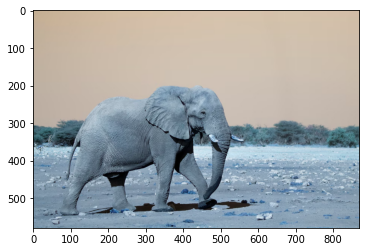

In [ ]:
img = cv2.imread('fotos/elefante.jpg')

plt.imshow(img)

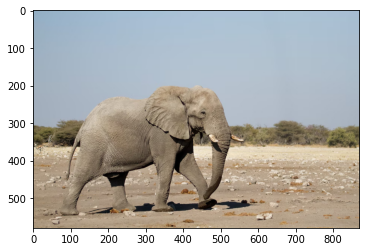

In [29]:
from skimage.io import imread
img = imread('fotos/elefante.jpg')

plt.imshow(img)

In [ ]:
resultados = model.detect([img], verbose = 0)

In [ ]:
resultados

[{'class_ids': array([21], dtype=int32), 'masks': array([[[False],
          [False],
          [False],
          ...,
          [False],
          [False],
          [False]],
  
         [[False],
          [False],
          [False],
          ...,
          [False],
          [False],
          [False]],
  
         [[False],
          [False],
          [False],
          ...,
          [False],
          [False],
          [False]],
  
         ...,
  
         [[False],
          [False],
          [False],
          ...,
          [False],
          [False],
          [False]],
  
         [[False],
          [False],
          [False],
          ...,
          [False],
          [False],
          [False]],
  
         [[False],
          [False],
          [False],
          ...,
          [False],
          [False],
          [False]]]), 'rois': array([[201,  71, 548, 564]], dtype=int32), 'scores': array([0.99995816], dtype=float32)}]

In [ ]:
r = resultados[0]

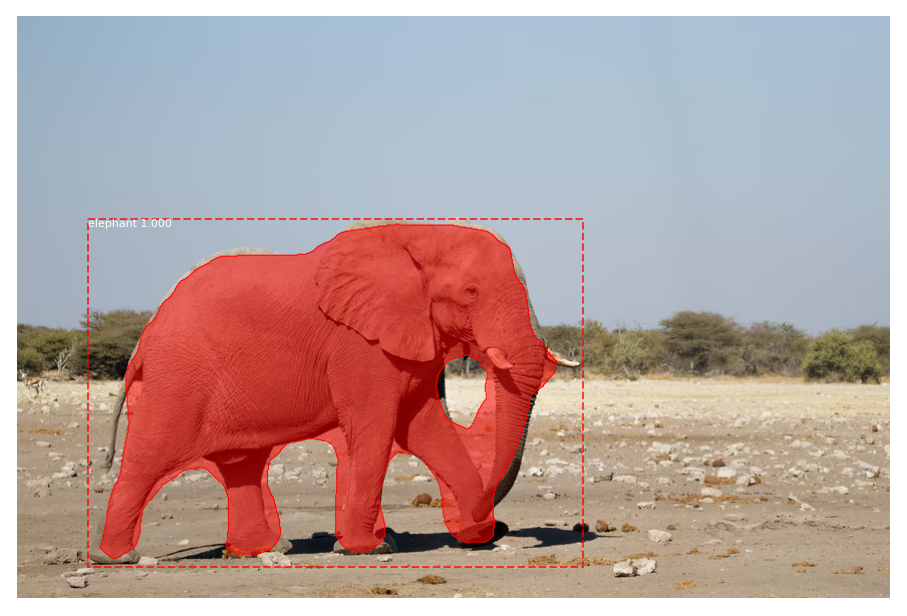

In [ ]:
visualize.display_instances(img, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])

In [ ]:
print('Objetos detectados: ', str(len(r['scores'])))

Objetos detectados:  1


In [ ]:
img = imread('/content/Mask_RCNN/images/2516944023_d00345997d_z.jpg')

In [ ]:
def mostrar_imagem(imagem):
  fig = plt.gcf()
  fig.set_size_inches(18, 8)
  plt.imshow(imagem, cmap = 'gray')
  plt.axis('off')
  plt.show()

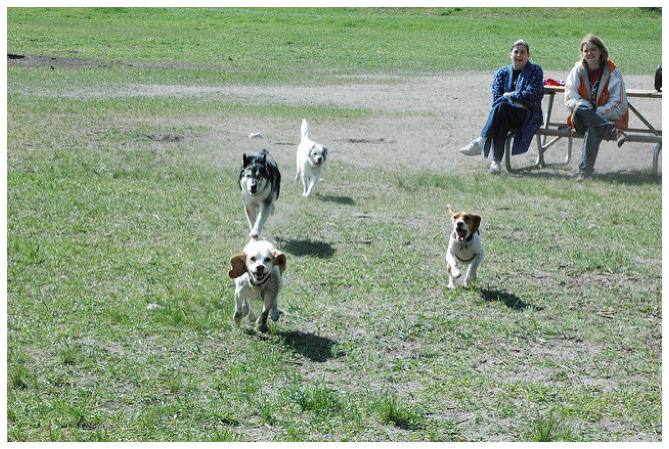

In [ ]:
mostrar_imagem(img)

In [ ]:
def segmentar_imagem(img):
  resultados = model.detect([img], verbose = 0)
  r = resultados[0]
  visualize.display_instances(img, r['rois'], r['masks'], r['class_ids'], class_names, r['scores'])
  print('Objetos detectados: ', str(len(r['scores'])))
  return r

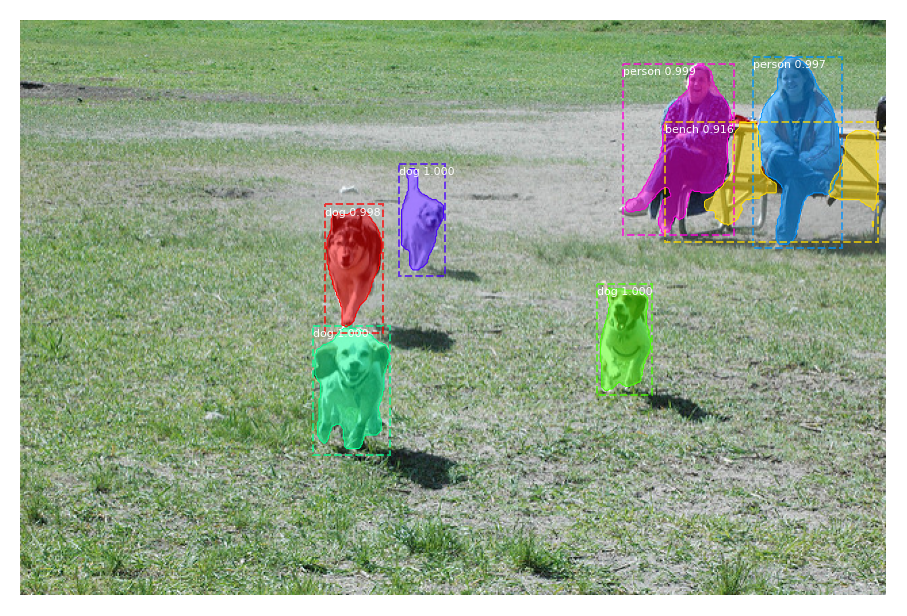

Objetos detectados:  7


In [ ]:
r = segmentar_imagem(img)

In [ ]:
# Cada máscara considera apenas o objeto de interesse e ignora os demais
def remover_fundo(img, r, idx):
  mask = r['masks'][:,:,idx]
  mask = np.stack((mask, ) * 3, axis = -1) # Adicionando os canais de cor na imagem
  mask = mask.astype('uint8')
  bg = 255 - mask * 255
  mask_exibir = np.invert(bg)

  mask_img = img * mask

  res = mask_img + bg

  return res, mask_exibir

In [ ]:
seg, mask_obj = remover_fundo(img, r, 0)

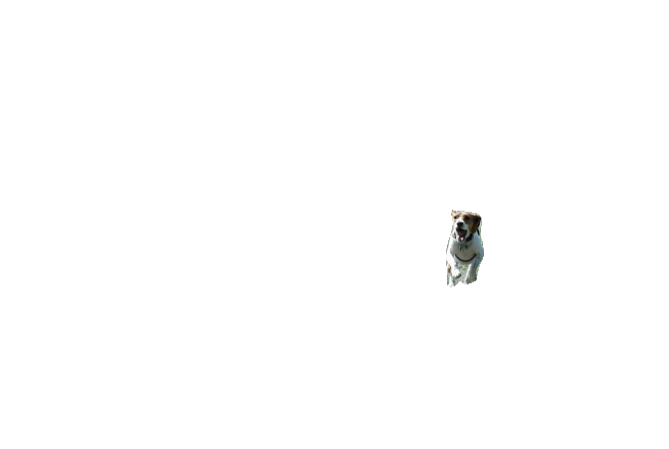

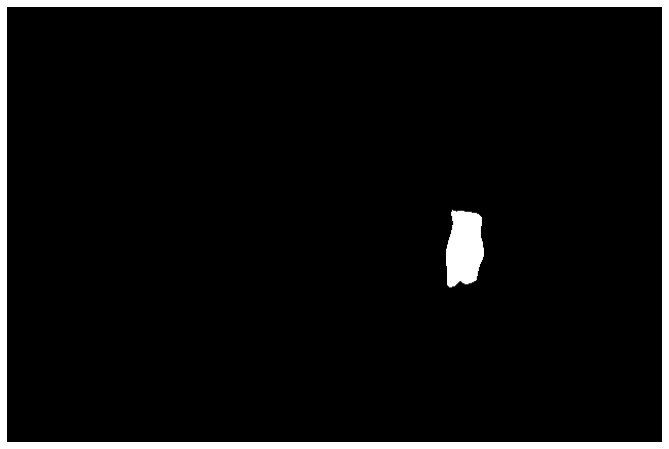

In [ ]:
mostrar_imagem(seg)
print()
mostrar_imagem(mask_obj)

In [ ]:
def mostrar_segmentacao(img, r, idx, show_mask = False):
  seg, mask_obj = remover_fundo(img, r, idx)

  plt.subplots(1, figsize = (16,16))
  plt.axis('off')

  if show_mask:
    plt.imshow(np.concatenate([mask_obj, seg], axis = 1))
  else:
    plt.imshow(np.concatenate([img, seg], axis = 1))

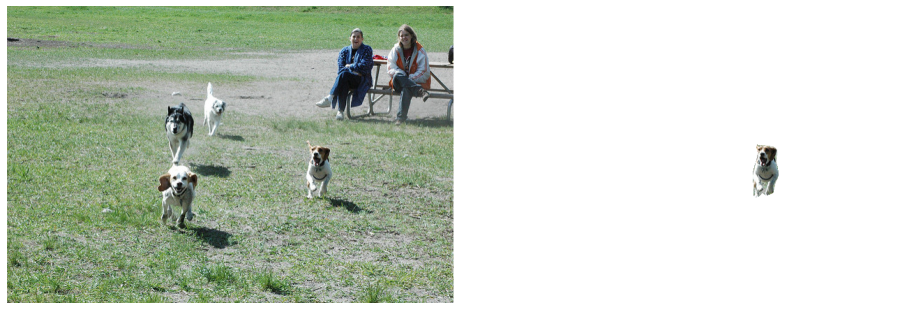

In [ ]:
mostrar_segmentacao(img, r, 0)

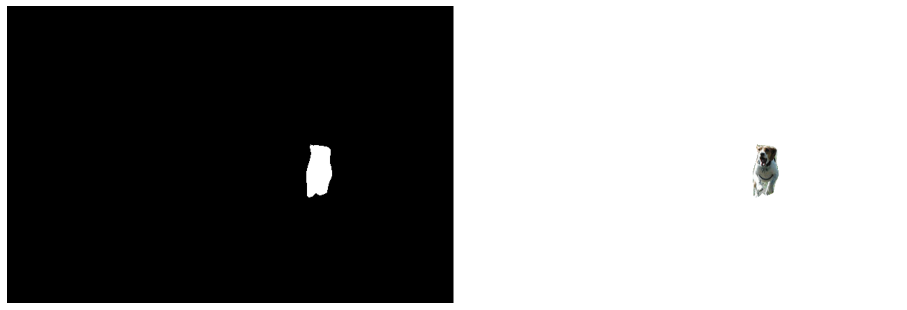

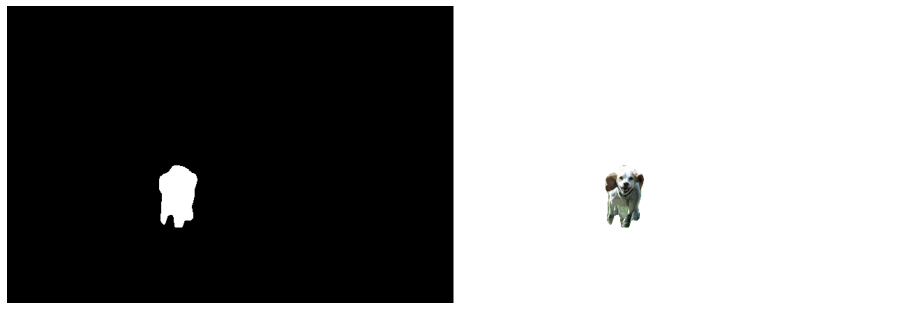

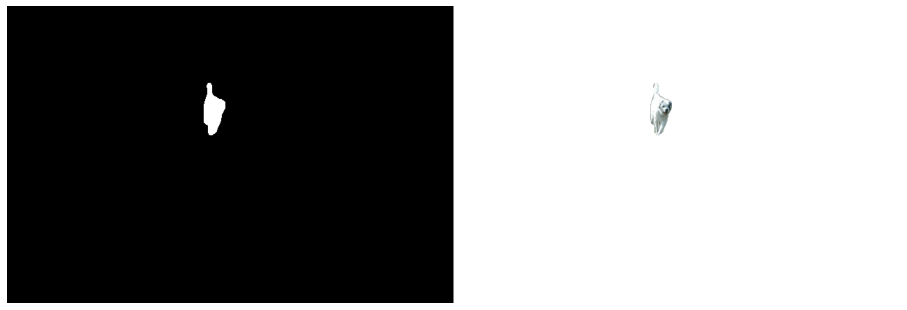

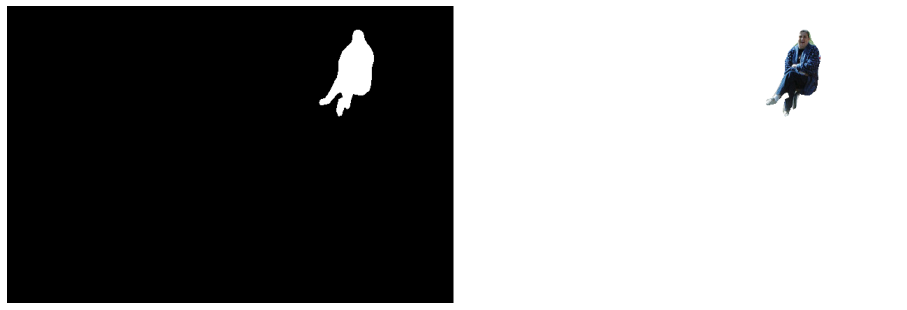

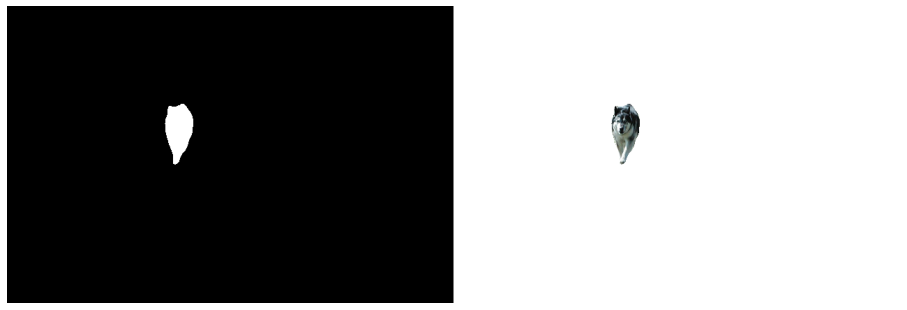

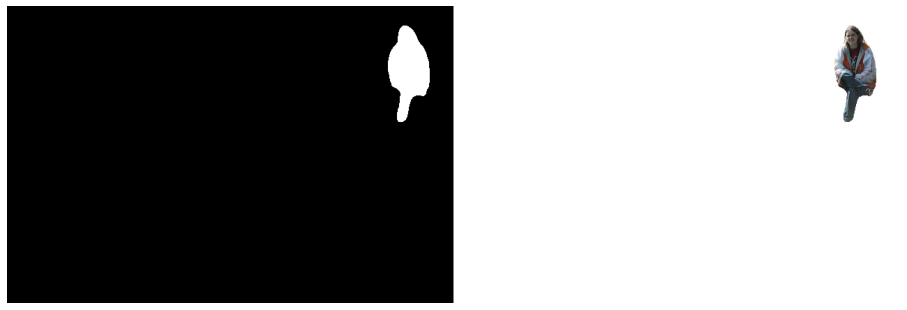

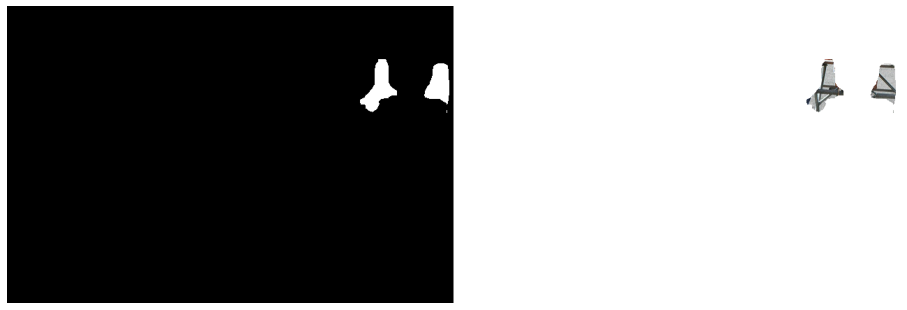

In [ ]:
for indice, roi in enumerate(r['rois']):
  mostrar_segmentacao(img, r, indice, True)

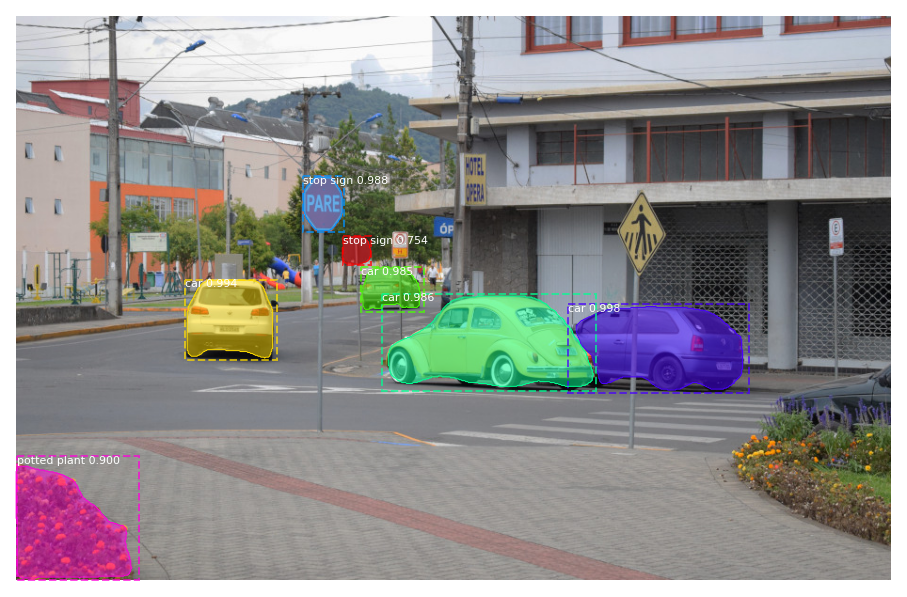

Objetos detectados:  7


In [ ]:
r = segmentar_imagem(imread('fotos/cena-urbana01.jpg'))

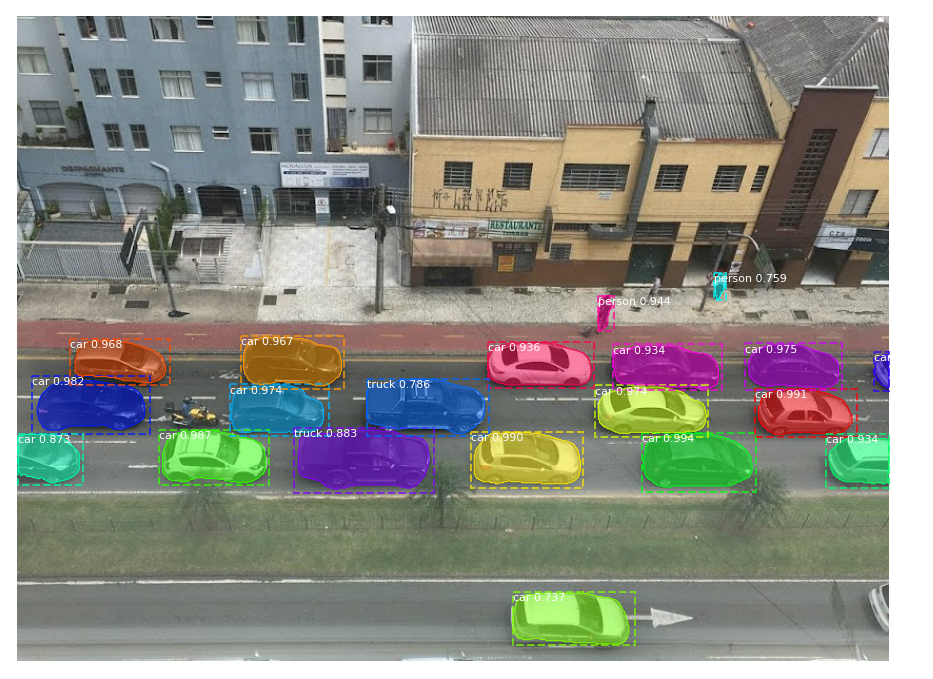

Objetos detectados:  20


In [ ]:
r = segmentar_imagem(imread('fotos/cena-urbana02.jpg'))

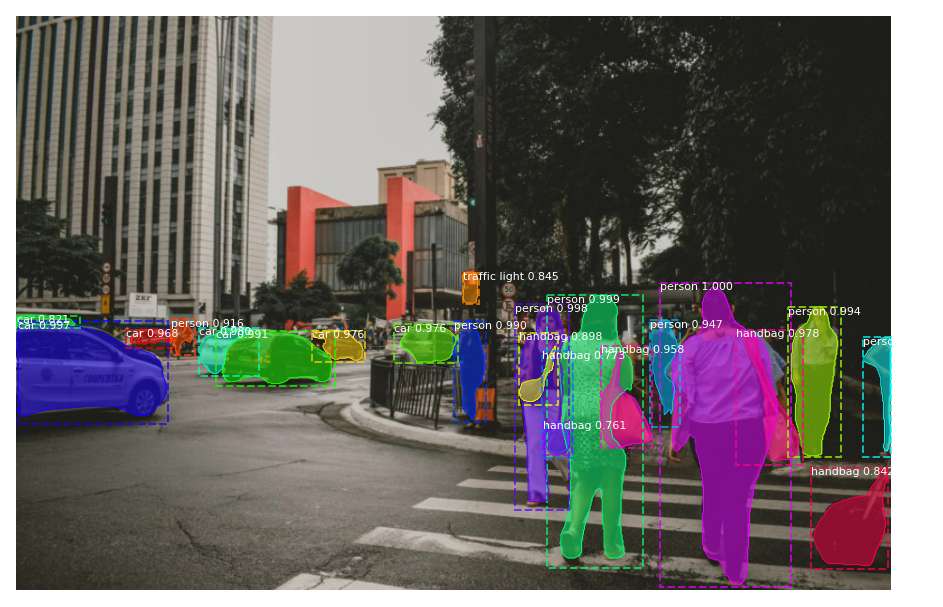

Objetos detectados:  22


In [ ]:
r = segmentar_imagem(imread('fotos/pedestres01.jpg'))

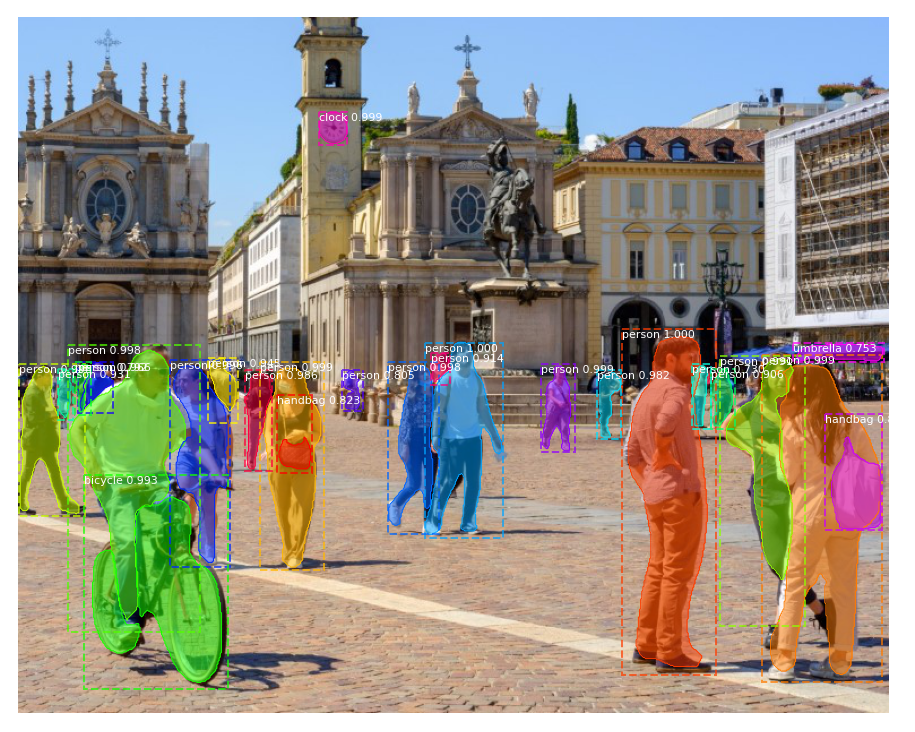

Objetos detectados:  25


In [ ]:
r = segmentar_imagem(imread('fotos/pedestres02.jpg'))

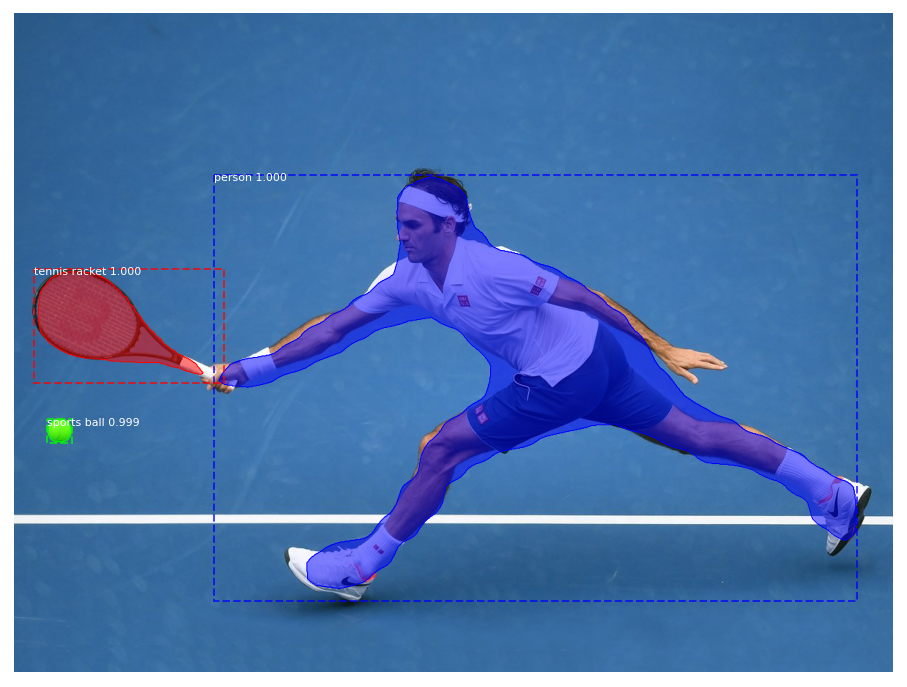

Objetos detectados:  3


In [ ]:
r = segmentar_imagem(imread('fotos/tenis01.jpg'))

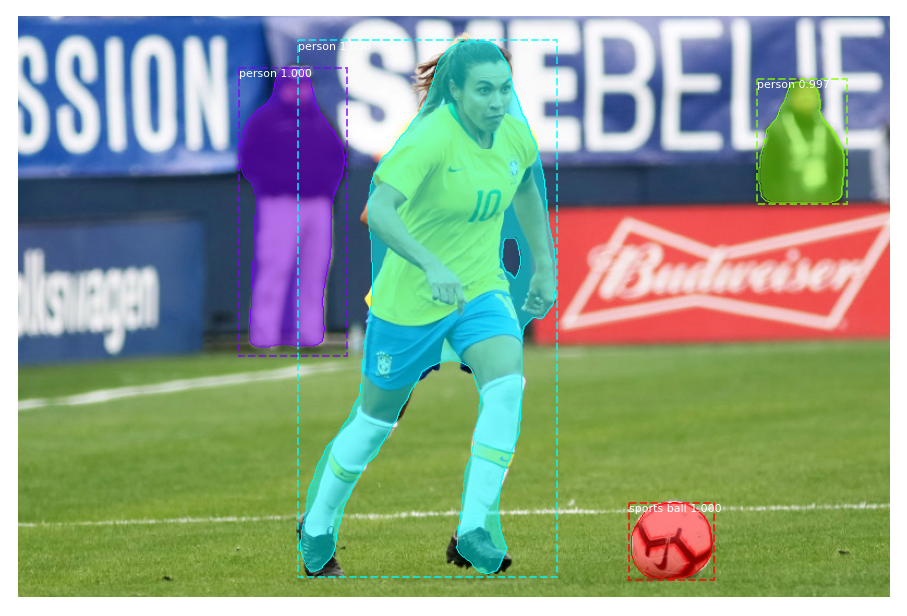

Objetos detectados:  4


In [ ]:
r = segmentar_imagem(imread('fotos/futebol01.jpg'))

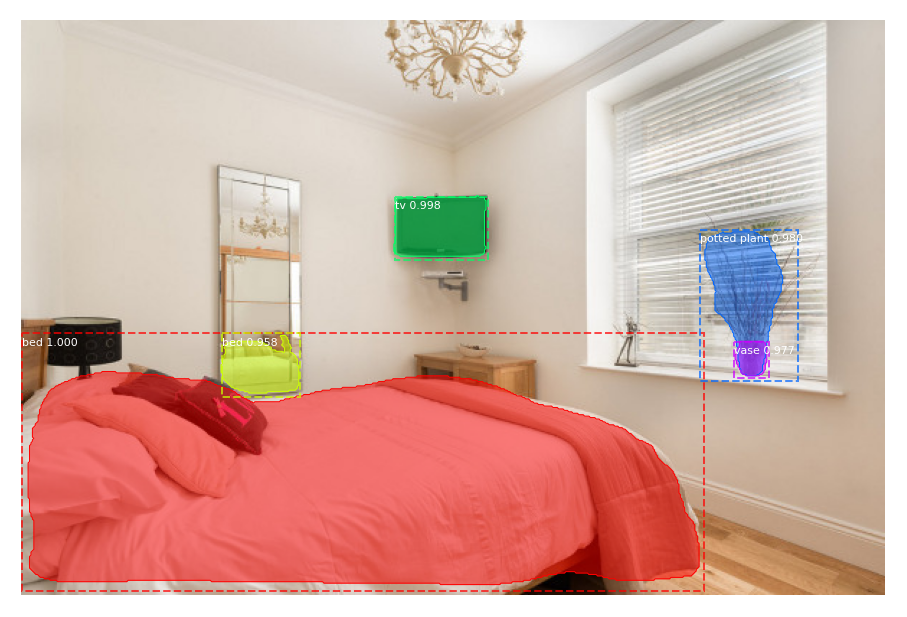

Objetos detectados:  5


In [ ]:
r = segmentar_imagem(imread('fotos/quarto.jpg'))

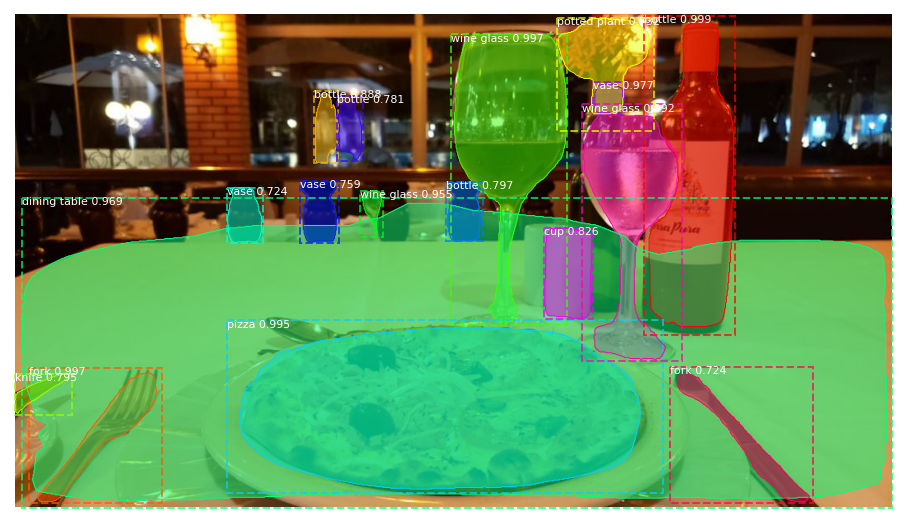

Objetos detectados:  17


In [ ]:
r = segmentar_imagem(imread('fotos/jantar.jpg'))

In [28]:
dir_fotos = 'fotos/'
caminhos = [os.path.join(dir_fotos, f) for f in os.listdir(dir_fotos)]

In [ ]:
for caminho_img in caminhos:
  try:
    img = imread(caminho_img)
    (H, W) = img.shape[:2]
  except:
    continue
  segmentar_imagem(img)

**Contagem de objetos**

In [33]:
classe_a_ser_contada = 'car'
classe_id = class_names.index(classe_a_ser_contada)
classe_nome = class_names[classe_id]
print(classe_id, classe_nome)

3 car


In [34]:
total = 0
print('Classe: ', classe_nome)

for caminho_img in caminhos:
  img = imread(caminho_img)
  resultados = model.detect([img], verbose = 0)
  r = resultados[0]
  numero = np.count_nonzero(r['class_ids'] == classe_id)
  total += numero
  print(str(caminho_img) + ' -> ' + classe_nome + ':' + str(numero))

Classe:  car
fotos/elefante.jpg -> car:0
fotos/baloes_teste01.jpg -> car:0
fotos/cena-urbana02.jpg -> car:16
fotos/tenis02.jpg -> car:1
fotos/rua_amostra.jpg -> car:10
fotos/pedestres02.jpg -> car:0
fotos/pedestres01.jpg -> car:7
fotos/cena-urbana01.jpg -> car:4
fotos/pedestres04.jpg -> car:5
fotos/cena-urbana03.jpg -> car:4
fotos/tenis01.jpg -> car:0
fotos/baloes_teste_03_.jpg -> car:0
fotos/driveseg_amostra.jpg -> car:9
fotos/pedestres03.jpg -> car:0
fotos/motocross.jpg -> car:0
fotos/quarto.jpg -> car:0
fotos/baloes_teste02.jpg -> car:0
fotos/futebol01.jpg -> car:0
fotos/jantar.jpg -> car:0
fotos/garota-e-cachorro.jpg -> car:0
fotos/tenis03.jpg -> car:0
